# Explore historical and future monthly LPJ-GUESS FPC and LAI

This notebook-style script performs exploration only. It does **not** aggregate
LPJ-GUESS PFTs, modify CLM PFT fractions, or write a surfdata file.

The same workflow is applied to the 1971–2000 and 2070–2100 monthly
climatologies. LPJ-GUESS PFTs remain separate. Plot colour identifies the CLM
target group used elsewhere in the mapping workflow; line style and marker
distinguish LPJ-GUESS PFTs that share a target group.


In [9]:
from pathlib import Path
import warnings

import matplotlib.path as mpath
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, TwoSlopeNorm
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
import xarray as xr

warnings.filterwarnings("ignore")
plt.rcParams.update({
    "font.family": "STIXGeneral",
    "mathtext.fontset": "stix",
    "font.size": 11,
    "axes.titlesize": 12,
})

import cartopy.crs as ccrs
import cartopy.feature as cfeature


## 1 · Configuration

Edit `DATA_DIR` if the four monthly climatology files are elsewhere. Figures
are saved as both PNG and PDF. Set `PFTS_TO_MAP` to a shorter list if you do
not want six-panel maps for every natural PFT.


In [10]:
DATA_DIR = Path("/nird/datapeak/NS9188K/adelez/BRL-FRST-XPSN/data/edit-surfdata/LPJ-GUESS")
FIGURE_DIR = Path("monthly-lpjguess-exploration-figures")
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

FILES = {
    "Historical (1971–2000)": {
        "fpc": DATA_DIR / "mfpc_pft_avg_1971_2000_monthly_mean.out",
        "lai": DATA_DIR / "mlai_pft_avg_1971_2000_monthly_mean.out",
    },
    "Future (2070–2100)": {
        "fpc": DATA_DIR / "mfpc_pft_avg_2070_2100_monthly_mean.out",
        "lai": DATA_DIR / "mlai_pft_avg_2070_2100_monthly_mean.out",
    },
}

LPJ_NATURAL = [
    "BNE", "BINE", "BNS", "TeNE", "TeBE", "IBS", "TeBS", "C3G",
    "HSE", "HSS", "LSE", "LSS", "GRT", "EPDS", "SPDS", "CLM",
]

PFT_TO_CLM_GROUP = {
    "BNE": "BoNET", "BINE": "BoNET",
    "BNS": "BoNDT (larch)",
    "IBS": "BoBDT",
    "HSE": "BoBDS shrubs", "HSS": "BoBDS shrubs",
    "LSE": "BoBDS shrubs", "LSS": "BoBDS shrubs",
    "EPDS": "BoBDS shrubs", "SPDS": "BoBDS shrubs",
    "C3G": "aC3", "GRT": "aC3",
    "TeNE": "Unmapped", "TeBE": "Unmapped", "TeBS": "Unmapped", "CLM": "Unmapped",
}

GROUP_COLORS = {
    "BoNET": "#145A32",
    "BoNDT (larch)": "#E67E22",
    "BoBDT": "#6B8E23",
    "BoBDS shrubs": "#D4A017",
    "aC3": "#8B5A2B",
    "Unmapped": "#7F7F7F",
}

PFT_LINESTYLES = ["-", "--", "-.", ":"]
PFT_MARKERS = ["o", "s", "^", "D", "v", "P"]
PFTS_TO_MAP = LPJ_NATURAL.copy()
PRESENCE_THRESHOLD = 1e-6
PEAK_AMPLITUDE_TOLERANCE = 1e-8
SCALE_PERCENTILE = 99.5
DIFFERENCE_VMAX = 0.6
MAP_EXTENT = [-180, 180, 45, 90]


def save_figure(fig, filename):
    fig.savefig(FIGURE_DIR / f"{filename}.png", dpi=300, bbox_inches="tight")
    fig.savefig(FIGURE_DIR / f"{filename}.pdf", bbox_inches="tight")


def slug(text):
    return "".join(character.lower() if character.isalnum() else "_" for character in text).strip("_")


## 2 · Robust loader and structural checks

Repeated header rows are removed before numeric conversion. Each file must
contain exactly one record for every `(Lon, Lat, Month)` key and every grid
cell must contain months 1–12. `Total` is checked against all PFT columns but
is not used in the analysis because it is not necessarily defined as their
simple sum.


In [11]:
def load_monthly_field(path):
    if not path.exists():
        raise FileNotFoundError(path)

    frame = pd.read_csv(path, sep=r"\s+", low_memory=False)
    if "Lon" not in frame.columns:
        raise ValueError(f"{path}: no Lon column; inspect the header")

    repeated_headers = frame["Lon"].astype(str).eq("Lon")
    frame = frame.loc[~repeated_headers].copy()

    required = {"Lon", "Lat", "Month", "Total", *LPJ_NATURAL}
    missing = required.difference(frame.columns)
    if missing:
        raise ValueError(f"{path}: missing columns {sorted(missing)}")

    for column in frame.columns:
        frame[column] = pd.to_numeric(frame[column], errors="raise")

    key = ["Lon", "Lat", "Month"]
    duplicate_count = int(frame.duplicated(key).sum())
    if duplicate_count:
        raise ValueError(f"{path}: {duplicate_count} duplicate Lon/Lat/Month rows")

    months = set(frame["Month"].unique())
    if months != set(range(1, 13)):
        raise ValueError(f"{path}: expected months 1–12, found {sorted(months)}")

    months_per_cell = frame.groupby(["Lon", "Lat"], observed=True)["Month"].nunique()
    incomplete_cells = int(months_per_cell.ne(12).sum())
    if incomplete_cells:
        raise ValueError(f"{path}: {incomplete_cells} grid cells do not have all 12 months")

    pft_columns = [column for column in frame if column not in {*key, "Total"}]
    total_residual = frame["Total"] - frame[pft_columns].sum(axis=1)
    indexed = frame.set_index(["Month", "Lat", "Lon"])

    field = indexed[pft_columns].to_xarray().to_array("pft")
    field = field.transpose("pft", "Month", "Lat", "Lon").rename({
        "Month": "month", "Lat": "lat", "Lon": "lon",
    })
    total = indexed["Total"].to_xarray().rename({
        "Month": "month", "Lat": "lat", "Lon": "lon",
    })

    report = {
        "file": path.name,
        "rows": len(frame),
        "grid cells": len(months_per_cell),
        "months": f"{int(frame.Month.min())}–{int(frame.Month.max())}",
        "repeated headers removed": int(repeated_headers.sum()),
        "duplicate keys": duplicate_count,
        "incomplete cells": incomplete_cells,
        "missing numeric values": int(frame.isna().sum().sum()),
        "lon range": f"{frame.Lon.min():g} to {frame.Lon.max():g}",
        "lat range": f"{frame.Lat.min():g} to {frame.Lat.max():g}",
        "Total − ΣPFT mean |residual|": float(total_residual.abs().mean()),
        "Total − ΣPFT max |residual|": float(total_residual.abs().max()),
    }
    return field.sel(pft=LPJ_NATURAL), total, report


data = {}
reports = []
for period, paths in FILES.items():
    fpc, fpc_total, fpc_report = load_monthly_field(paths["fpc"])
    lai, lai_total, lai_report = load_monthly_field(paths["lai"])
    fpc, lai = xr.align(fpc, lai, join="exact")
    data[period] = {"fpc": fpc, "lai": lai, "fpc_total": fpc_total, "lai_total": lai_total}
    reports.extend([{"period": period, "variable": "FPC", **fpc_report},
                    {"period": period, "variable": "LAI", **lai_report}])

historical_name, future_name = FILES
xr.align(data[historical_name]["fpc"], data[future_name]["fpc"], join="exact")
xr.align(data[historical_name]["lai"], data[future_name]["lai"], join="exact")

quality_report = pd.DataFrame(reports).set_index(["period", "variable"])
display(quality_report)
print("FPC and LAI coordinates match exactly within and between periods.")
if quality_report["Total − ΣPFT max |residual|"].max() > 1e-5:
    print("WARNING: Total differs from the simple sum of PFT columns; Total is not used below.")


file  \
period                 variable                                            
Historical (1971–2000) FPC       mfpc_pft_avg_1971_2000_monthly_mean.out   
                       LAI       mlai_pft_avg_1971_2000_monthly_mean.out   
Future (2070–2100)     FPC       mfpc_pft_avg_2070_2100_monthly_mean.out   
                       LAI       mlai_pft_avg_2070_2100_monthly_mean.out   

                                   rows  grid cells months  \
period                 variable                              
Historical (1971–2000) FPC       200568       16714   1–12   
                       LAI       200568       16714   1–12   
Future (2070–2100)     FPC       199428       16619   1–12   
                       LAI       199428       16619   1–12   

                                 repeated headers removed  duplicate keys  \
period                 variable                                             
Historical (1971–2000) FPC                              0               0   
                       LAI                              0               0   
Future (2070–2100)     FPC                              1               0   
                       LAI                              1               0   

                                 incomplete cells  missing numeric values  \
period                 variable                                             
Historical (1971–2000) FPC                      0                       0   
                       LAI                      0                       0   
Future (2070–2100)     FPC                      0                       0   
                       LAI                      0                       0   

                                         lon range       lat range  \
period                 variable                                      
Historical (1971–2000) FPC       -179.75 to 179.75  45.75 to 83.25   
                       LAI       -179.75 to 179.75  45.75 to 83.25   
Future (2070–2100)     FPC       -179.75 to 179.75  45.75 to 83.25   
                       LAI       -179.75 to 179.75  45.75 to 83.25   

                                 Total − ΣPFT mean |residual|  \
period                 variable                                 
Historical (1971–2000) FPC                           0.099935   
                       LAI                           0.340991   
Future (2070–2100)     FPC                           0.135690   
                       LAI                           0.501226   

                                 Total − ΣPFT max |residual|  
period                 variable                               
Historical (1971–2000) FPC                          0.907504  
                       LAI                          3.247252  
Future (2070–2100)     FPC                          0.985852  
                       LAI                          4.228732

FPC and LAI coordinates match exactly within and between periods.


## 3 · Derive comparable monthly, annual, JJA and peak-period fields

Two peak definitions are retained:

- `peak_fpc`: cellwise maximum of the 12 monthly means;
- `peak3_fpc`: cellwise maximum of a circular three-month running mean.

The three-month peak is less sensitive to one-month noise. LAI is sampled at
the month of maximum FPC, not maximized independently. A peak month is reported
only where the PFT is present and the seasonal amplitude is non-zero; this
avoids assigning January to flat evergreen cycles merely because `argmax`
returns the first tied month.


In [12]:
def circular_three_month_mean(field):
    previous_month = field.roll(month=1, roll_coords=False)
    next_month = field.roll(month=-1, roll_coords=False)
    return (previous_month + field + next_month) / 3


def derive_fields(fpc, lai):
    fpc, lai = xr.align(fpc, lai, join="exact")
    valid = np.isfinite(fpc).any("month") & np.isfinite(lai).any("month")
    peak_index = fpc.fillna(-np.inf).argmax("month")
    peak_fpc = fpc.max("month", skipna=True).where(valid)
    amplitude = (peak_fpc - fpc.min("month", skipna=True)).where(valid)
    peak_month = (peak_index + 1).where(
        valid & (peak_fpc > PRESENCE_THRESHOLD) & (amplitude > PEAK_AMPLITUDE_TOLERANCE)
    )

    fpc3 = circular_three_month_mean(fpc)
    peak3_index = fpc3.fillna(-np.inf).argmax("month")
    peak3_fpc = fpc3.max("month", skipna=True).where(valid)
    peak3_month = (peak3_index + 1).where(
        valid & (peak3_fpc > PRESENCE_THRESHOLD) & (amplitude > PEAK_AMPLITUDE_TOLERANCE)
    )

    lai_at_fpc_peak = lai.isel(month=peak_index).reset_coords("month", drop=True).where(valid)

    return xr.Dataset({
        "annual_mean_fpc": fpc.mean("month", skipna=True).where(valid),
        "jja_mean_fpc": fpc.sel(month=[6, 7, 8]).mean("month", skipna=True).where(valid),
        "peak_fpc": peak_fpc,
        "peak_month": peak_month,
        "peak3_fpc": peak3_fpc,
        "peak3_month": peak3_month,
        "lai_at_fpc_peak": lai_at_fpc_peak,
        "annual_mean_lai": lai.mean("month", skipna=True).where(valid),
        "jja_mean_lai": lai.sel(month=[6, 7, 8]).mean("month", skipna=True).where(valid),
    })


for period in data:
    data[period]["derived"] = derive_fields(data[period]["fpc"], data[period]["lai"])

latitude_weights = xr.DataArray(
    np.cos(np.deg2rad(data[historical_name]["fpc"].lat)),
    coords={"lat": data[historical_name]["fpc"].lat}, dims="lat", name="coslat",
)


def weighted_mean(field):
    weights = latitude_weights.broadcast_like(field)
    return field.weighted(weights).mean(("lat", "lon"), skipna=True)


def weighted_modal_month(month_field):
    weights = latitude_weights.broadcast_like(month_field)
    month_weights = xr.concat([
        weights.where(month_field == month).sum(("lat", "lon"), skipna=True)
        for month in range(1, 13)
    ], dim=pd.Index(range(1, 13), name="candidate_month"))
    mode = month_weights.idxmax("candidate_month")
    return mode.where(month_weights.sum("candidate_month") > 0)


def period_summary(period):
    derived = data[period]["derived"]
    seasonal = weighted_mean(data[period]["fpc"])
    rows = []
    for pft in LPJ_NATURAL:
        annual = float(weighted_mean(derived.annual_mean_fpc.sel(pft=pft)))
        jja = float(weighted_mean(derived.jja_mean_fpc.sel(pft=pft)))
        peak = float(weighted_mean(derived.peak_fpc.sel(pft=pft)))
        peak3 = float(weighted_mean(derived.peak3_fpc.sel(pft=pft)))
        cycle = seasonal.sel(pft=pft)
        cycle_range = float(cycle.max() - cycle.min())
        spatial_peak_month = int(cycle.idxmax("month")) if cycle_range > PEAK_AMPLITUDE_TOLERANCE else np.nan
        modal_peak_month = weighted_modal_month(derived.peak_month.sel(pft=pft)).item()
        rows.append({
            "period": period, "PFT": pft, "CLM group": PFT_TO_CLM_GROUP[pft],
            "annual mean FPC": annual, "JJA mean FPC": jja,
            "single-month peak FPC": peak, "three-month peak FPC": peak3,
            "spatial-mean peak month": spatial_peak_month,
            "modal cellwise peak month": modal_peak_month,
            "annual / peak": annual / peak if peak > 0 else np.nan,
            "JJA / peak": jja / peak if peak > 0 else np.nan,
            "peak uplift over annual [%]": 100 * (peak / annual - 1) if annual > 0 else np.nan,
        })
    return pd.DataFrame(rows)


summary = pd.concat([period_summary(period) for period in data], ignore_index=True)
display(summary.set_index(["period", "PFT"]).round(3))

change_summary = (
    summary.pivot(index=["PFT", "CLM group"], columns="period",
                  values=["annual mean FPC", "JJA mean FPC", "single-month peak FPC"])
)
for metric in ["annual mean FPC", "JJA mean FPC", "single-month peak FPC"]:
    change_summary[(f"Δ {metric}", "Future − historical")] = (
        change_summary[(metric, future_name)] - change_summary[(metric, historical_name)]
    )
display(change_summary.round(3))


CLM group  annual mean FPC  JJA mean FPC  \
period                 PFT                                                  
Historical (1971–2000) BNE           BoNET            0.159         0.159   
                       BINE          BoNET            0.067         0.067   
                       BNS   BoNDT (larch)            0.018         0.051   
                       TeNE       Unmapped            0.000         0.000   
                       TeBE       Unmapped            0.000         0.000   
                       IBS           BoBDT            0.012         0.030   
                       TeBS       Unmapped            0.002         0.004   
                       C3G             aC3            0.044         0.123   
                       HSE    BoBDS shrubs            0.001         0.001   
                       HSS    BoBDS shrubs            0.005         0.013   
                       LSE    BoBDS shrubs            0.004         0.004   
                       LSS    BoBDS shrubs            0.002         0.007   
                       GRT             aC3            0.023         0.073   
                       EPDS   BoBDS shrubs            0.002         0.002   
                       SPDS   BoBDS shrubs            0.002         0.005   
                       CLM        Unmapped            0.000         0.000   
Future (2070–2100)     BNE           BoNET            0.153         0.153   
                       BINE          BoNET            0.113         0.113   
                       BNS   BoNDT (larch)            0.048         0.122   
                       TeNE       Unmapped            0.000         0.000   
                       TeBE       Unmapped            0.000         0.000   
                       IBS           BoBDT            0.052         0.111   
                       TeBS       Unmapped            0.008         0.014   
                       C3G             aC3            0.037         0.089   
                       HSE    BoBDS shrubs            0.002         0.002   
                       HSS    BoBDS shrubs            0.011         0.027   
                       LSE    BoBDS shrubs            0.003         0.003   
                       LSS    BoBDS shrubs            0.004         0.011   
                       GRT             aC3            0.009         0.026   
                       EPDS   BoBDS shrubs            0.001         0.001   
                       SPDS   BoBDS shrubs            0.000         0.001   
                       CLM        Unmapped            0.000         0.000   

                             single-month peak FPC  three-month peak FPC  \
period                 PFT                                                 
Historical (1971–2000) BNE                   0.159                 0.159   
                       BINE                  0.067                 0.067   
                       BNS                   0.053                 0.052   
                       TeNE                  0.000                 0.000   
                       TeBE                  0.000                 0.000   
                       IBS                   0.031                 0.031   
                       TeBS                  0.004                 0.004   
                       C3G                   0.141                 0.134   
                       HSE                   0.001                 0.001   
                       HSS                   0.014                 0.014   
                       LSE                   0.004                 0.004   
                       LSS                   0.007                 0.007   
                       GRT                   0.086                 0.077   
                       EPDS                  0.002                 0.002   
                       SPDS                  0.006                 0.005   
                       CLM                   0.000                 0.000   
Future (2070–2100)     BNE                   0

annual mean FPC                         \
period             Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                 
BINE BoNET                      0.113                  0.067   
BNE  BoNET                      0.153                  0.159   
BNS  BoNDT (larch)              0.048                  0.018   
C3G  aC3                        0.037                  0.044   
CLM  Unmapped                   0.000                  0.000   
EPDS BoBDS shrubs               0.001                  0.002   
GRT  aC3                        0.009                  0.023   
HSE  BoBDS shrubs               0.002                  0.001   
HSS  BoBDS shrubs               0.011                  0.005   
IBS  BoBDT                      0.052                  0.012   
LSE  BoBDS shrubs               0.003                  0.004   
LSS  BoBDS shrubs               0.004                  0.002   
SPDS BoBDS shrubs               0.000                  0.002   
TeBE Unmapped                   0.000                  0.000   
TeBS Unmapped                   0.008                  0.002   
TeNE Unmapped                   0.000                  0.000   

                         JJA mean FPC                         \
period             Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                 
BINE BoNET                      0.113                  0.067   
BNE  BoNET                      0.153                  0.159   
BNS  BoNDT (larch)              0.122                  0.051   
C3G  aC3                        0.089                  0.123   
CLM  Unmapped                   0.000                  0.000   
EPDS BoBDS shrubs               0.001                  0.002   
GRT  aC3                        0.026                  0.073   
HSE  BoBDS shrubs               0.002                  0.001   
HSS  BoBDS shrubs               0.027                  0.013   
IBS  BoBDT                      0.111                  0.030   
LSE  BoBDS shrubs               0.003                  0.004   
LSS  BoBDS shrubs               0.011                  0.007   
SPDS BoBDS shrubs               0.001                  0.005   
TeBE Unmapped                   0.000                  0.000   
TeBS Unmapped                   0.014                  0.004   
TeNE Unmapped                   0.000                  0.000   

                   single-month peak FPC                         \
period                Future (2070–2100) Historical (1971–2000)   
PFT  CLM group                                                    
BINE BoNET                         0.113                  0.067   
BNE  BoNET                         0.154                  0.159   
BNS  BoNDT (larch)                 0.124                  0.053   
C3G  aC3                           0.096                  0.141   
CLM  Unmapped                      0.000                  0.000   
EPDS BoBDS shrubs                  0.001                  0.002   
GRT  aC3                           0.029                  0.086   
HSE  BoBDS shrubs                  0.002                  0.001   
HSS  BoBDS shrubs                  0.029                  0.014   
IBS  BoBDT                         0.113                  0.031   
LSE  BoBDS shrubs                  0.003                  0.004   
LSS  BoBDS shrubs                  0.011                  0.007   
SPDS BoBDS shrubs                  0.001                  0.006   
TeBE Unmapped                      0.000                  0.000   
TeBS Unmapped                      0.014                  0.004   
TeNE Unmapped                      0.000                  0.000   

                     Δ annual mean FPC      Δ JJA mean FPC  \
period             Future − historical Future − historical   
PFT  CLM group                                               
BINE BoNET                       0.046               0.046   
BNE  BoNET                      -0.006              -0.006   
BNS 

## 4 · Seasonal cycles by CLM colour group

The panels are grouped only for readability. No PFTs are summed. Solid or
patterned curves are monthly values; faint matching horizontal lines are the
annual means. Historical and future periods are plotted separately with the
same y-axis range within each CLM-colour panel.


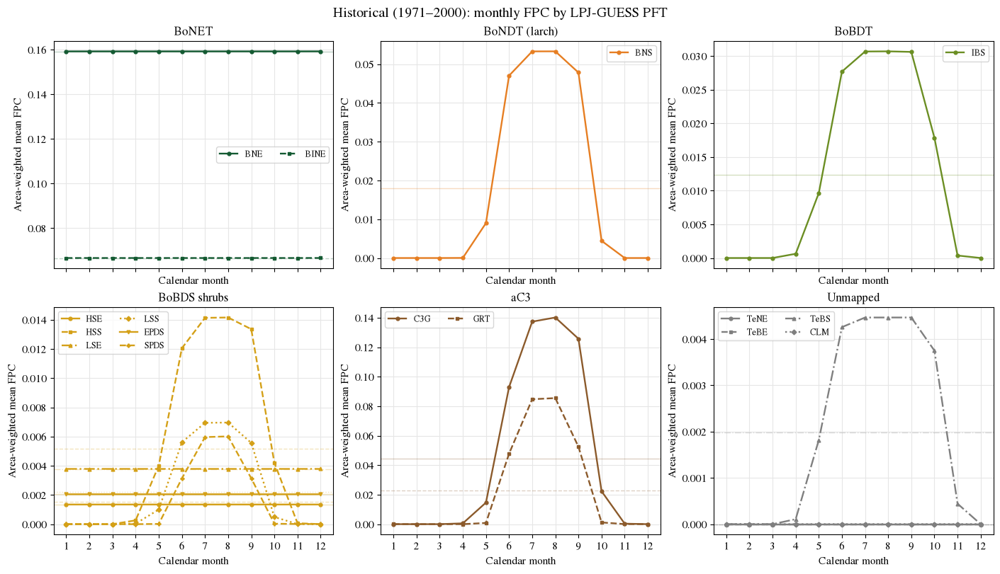

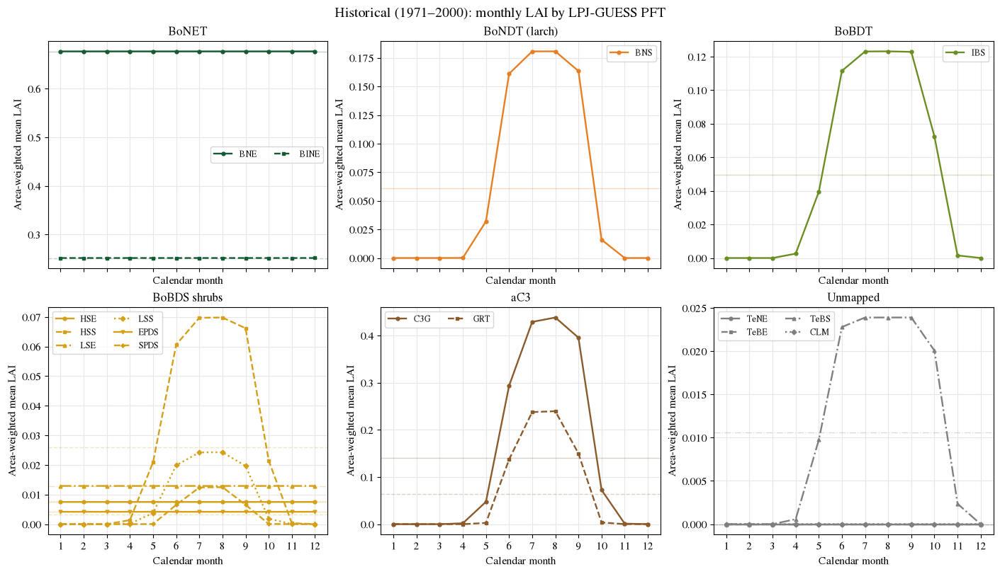

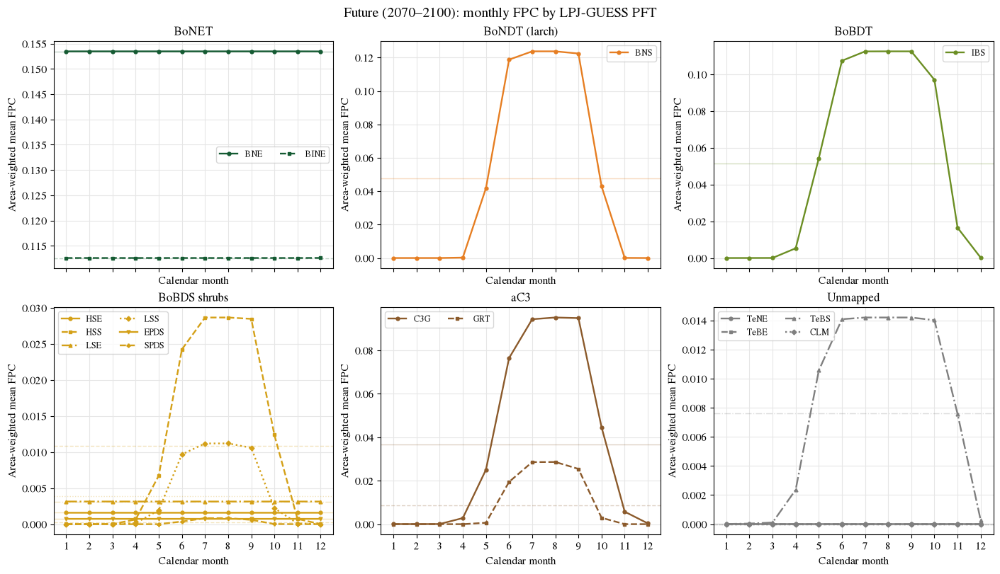

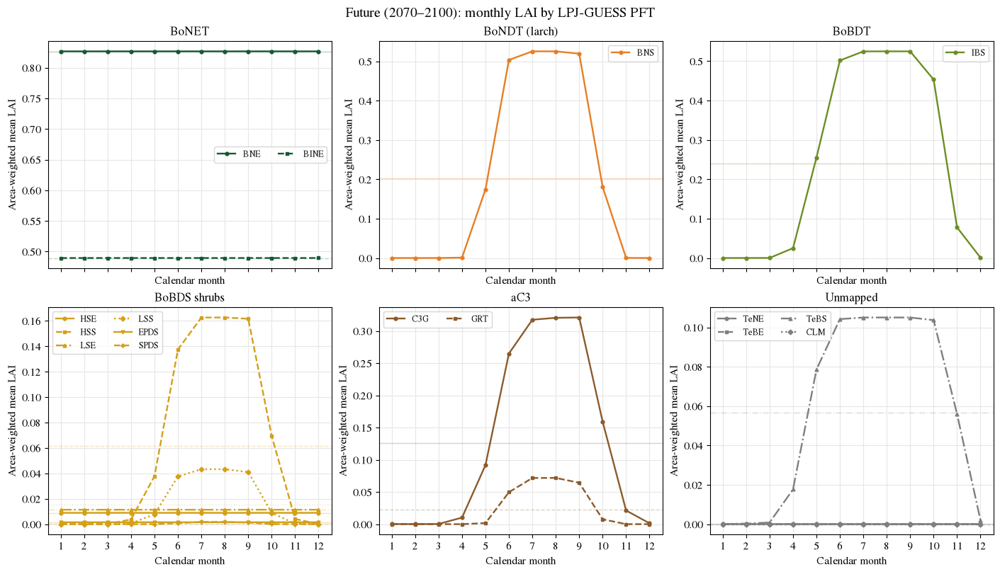

In [13]:
def members_by_group():
    return {
        group: [pft for pft in LPJ_NATURAL if PFT_TO_CLM_GROUP[pft] == group]
        for group in GROUP_COLORS
    }


def pft_style(pft, members):
    index = members.index(pft)
    return PFT_LINESTYLES[index % len(PFT_LINESTYLES)], PFT_MARKERS[index % len(PFT_MARKERS)]


def plot_seasonal_cycles(period, variable="fpc"):
    groups = members_by_group()
    fig, axes = plt.subplots(2, 3, figsize=(14, 8), sharex=True, layout="constrained")
    axes = axes.ravel()
    seasonal = weighted_mean(data[period][variable])

    for ax, (group, members) in zip(axes, groups.items()):
        color = GROUP_COLORS[group]
        for pft in members:
            line_style, marker = pft_style(pft, members)
            cycle = seasonal.sel(pft=pft)
            ax.plot(cycle.month, cycle, color=color, linestyle=line_style, marker=marker,
                    markersize=3.5, linewidth=1.7, label=pft)
            ax.axhline(float(cycle.mean("month")), color=color, linestyle=line_style,
                       linewidth=1.0, alpha=0.28)
        ax.set(title=group, xticks=range(1, 13), xlabel="Calendar month",
               ylabel=f"Area-weighted mean {variable.upper()}")
        ax.grid(color="0.9")
        ax.set_axisbelow(True)
        ax.legend(ncol=2, fontsize=9)

    fig.suptitle(f"{period}: monthly {variable.upper()} by LPJ-GUESS PFT", fontsize=14)
    save_figure(fig, f"{slug(period)}_{variable}_seasonal_cycles")
    plt.show()


for period in data:
    plot_seasonal_cycles(period, "fpc")
    plot_seasonal_cycles(period, "lai")


## 5 · Annual, JJA and peak FPC comparison

Bar colour continues to identify the CLM target group. Hatching identifies
the temporal statistic, so the PFT-to-group colour mapping remains unchanged.


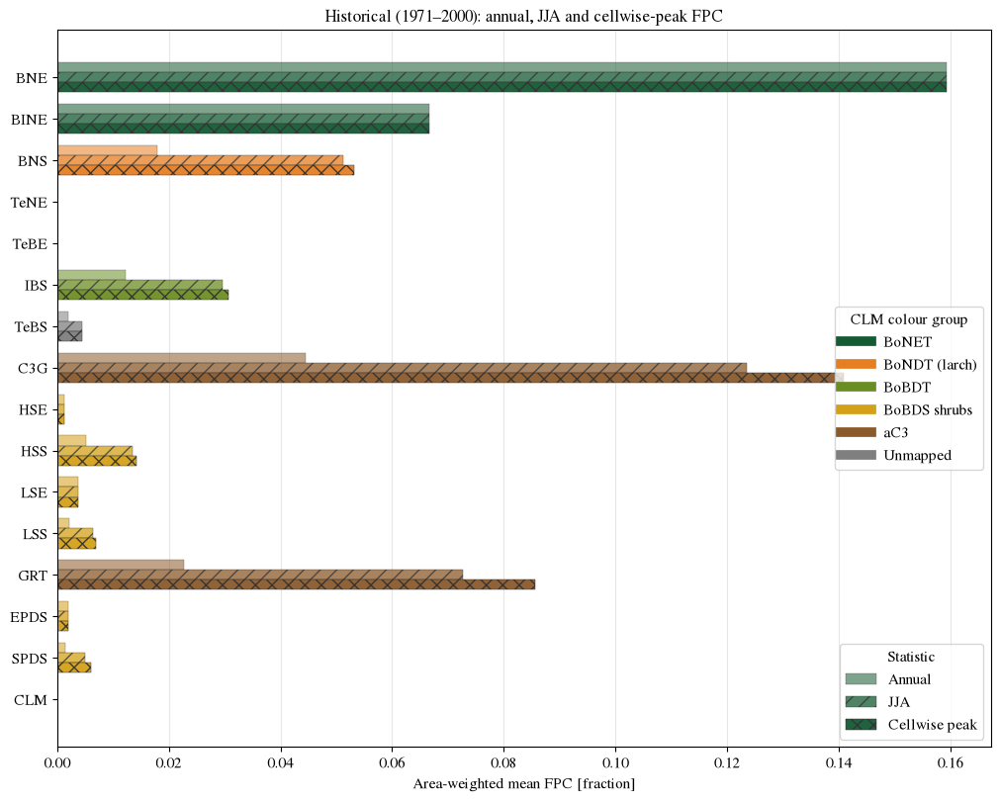

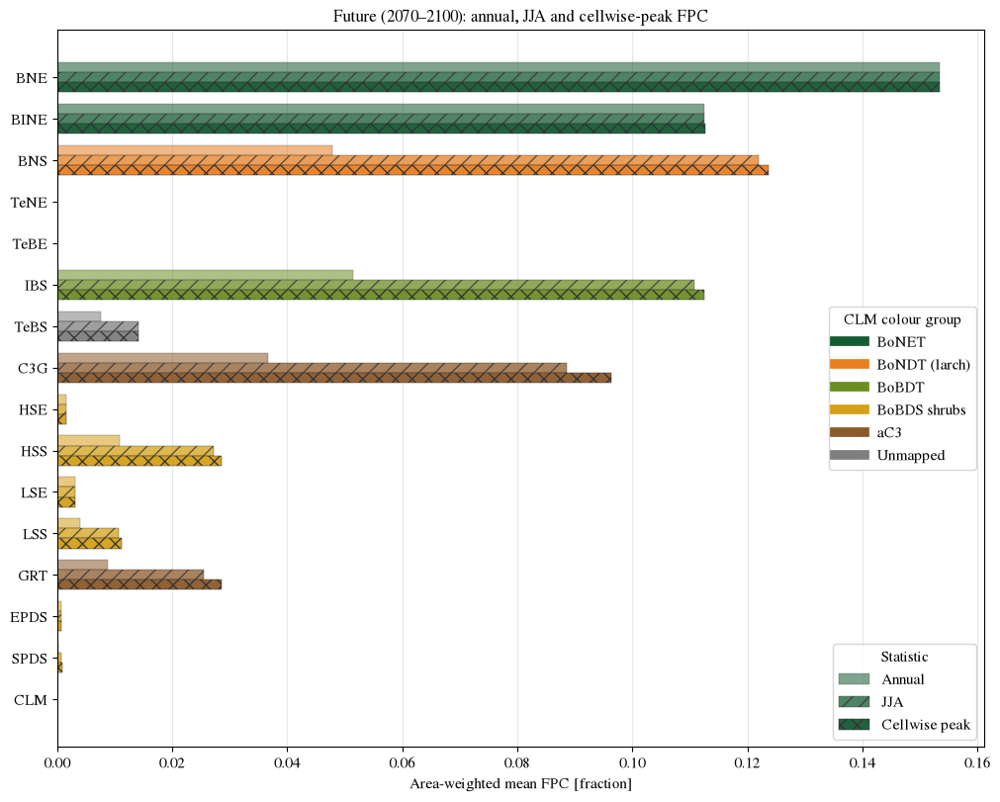

In [14]:
def plot_period_metric_comparison(period):
    table = summary.loc[summary.period == period].set_index("PFT").loc[LPJ_NATURAL]
    metrics = ["annual mean FPC", "JJA mean FPC", "single-month peak FPC"]
    labels = ["Annual", "JJA", "Cellwise peak"]
    hatches = ["", "//", "xx"]
    y = np.arange(len(table))
    height = 0.24
    colors = [GROUP_COLORS[group] for group in table["CLM group"]]

    fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")
    for index, (metric, label, hatch) in enumerate(zip(metrics, labels, hatches)):
        ax.barh(y + (index - 1) * height, table[metric], height=height, color=colors,
                alpha=0.55 + 0.2 * index, edgecolor="0.2", linewidth=0.35,
                hatch=hatch, label=label)
    ax.set(yticks=y, yticklabels=table.index, xlabel="Area-weighted mean FPC [fraction]",
           title=f"{period}: annual, JJA and cellwise-peak FPC")
    ax.invert_yaxis()
    ax.grid(axis="x", color="0.9")
    ax.set_axisbelow(True)
    metric_legend = ax.legend(title="Statistic", loc="lower right")
    group_handles = [Line2D([0], [0], color=color, lw=7, label=group)
                     for group, color in GROUP_COLORS.items()]
    ax.add_artist(metric_legend)
    ax.legend(handles=group_handles, title="CLM colour group", loc="center right")
    save_figure(fig, f"{slug(period)}_annual_jja_peak_fpc")
    plt.show()


for period in data:
    plot_period_metric_comparison(period)


## 6 · Arctic maps for every LPJ-GUESS PFT and period

Each six-panel figure shows annual mean, JJA mean, single-month cellwise peak,
peak minus annual mean, peak minus JJA, and the local peak-minus-annual
correction normalized by the **domain-wide area-weighted annual mean** of that
PFT. The explicit factor of 100 makes the normalized panel a percentage.
Absolute annual/JJA/peak maps share a scale within each PFT and period.


Common normalized-correction scale: 0–3990.0% (99.5th percentile)


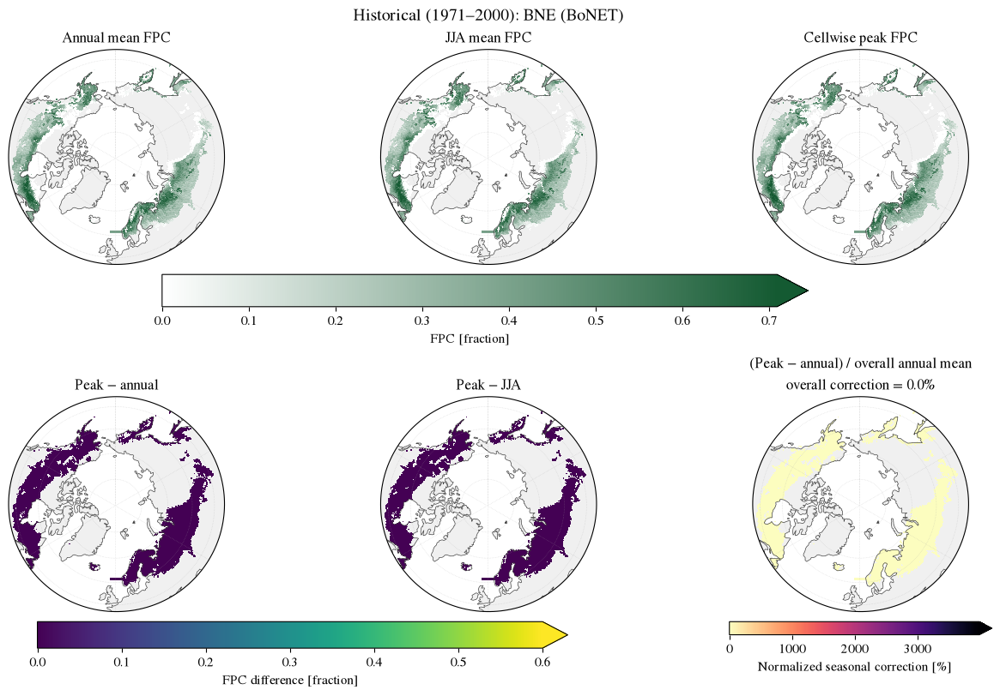

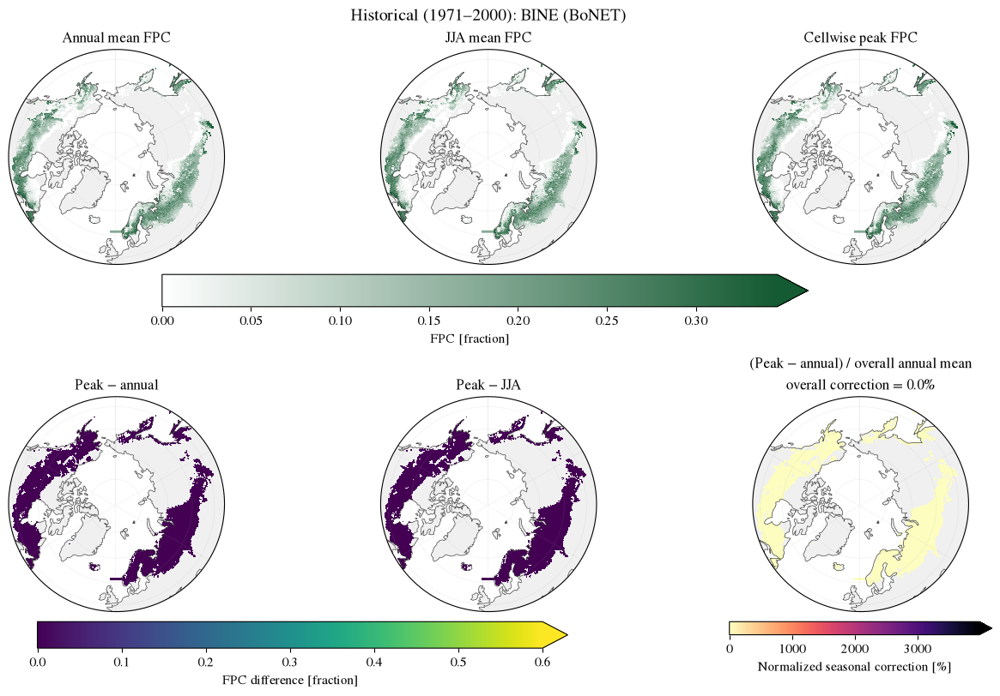

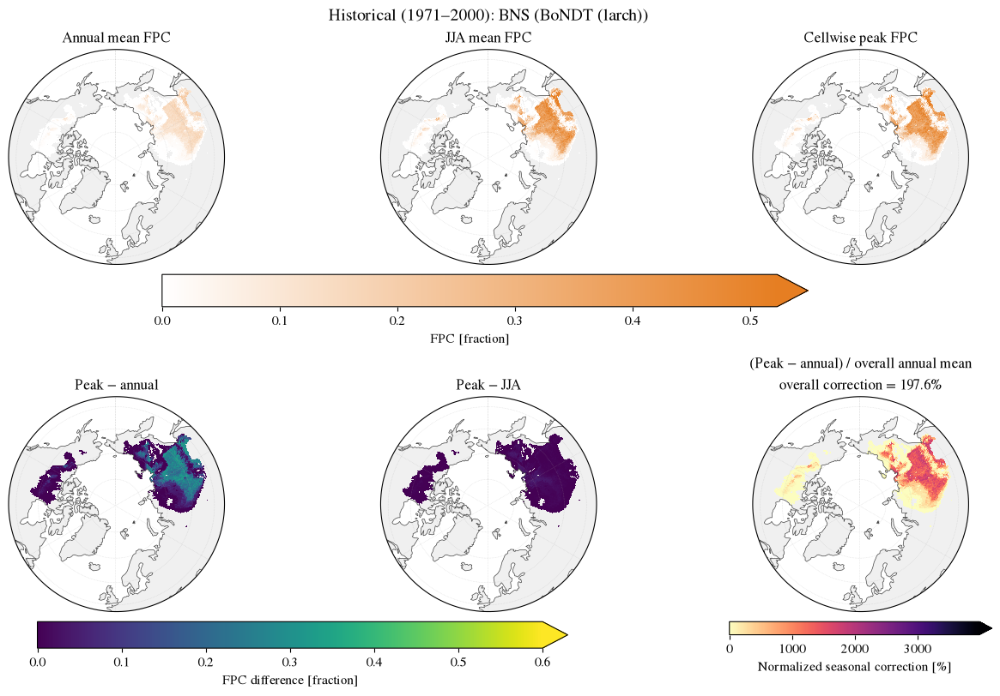

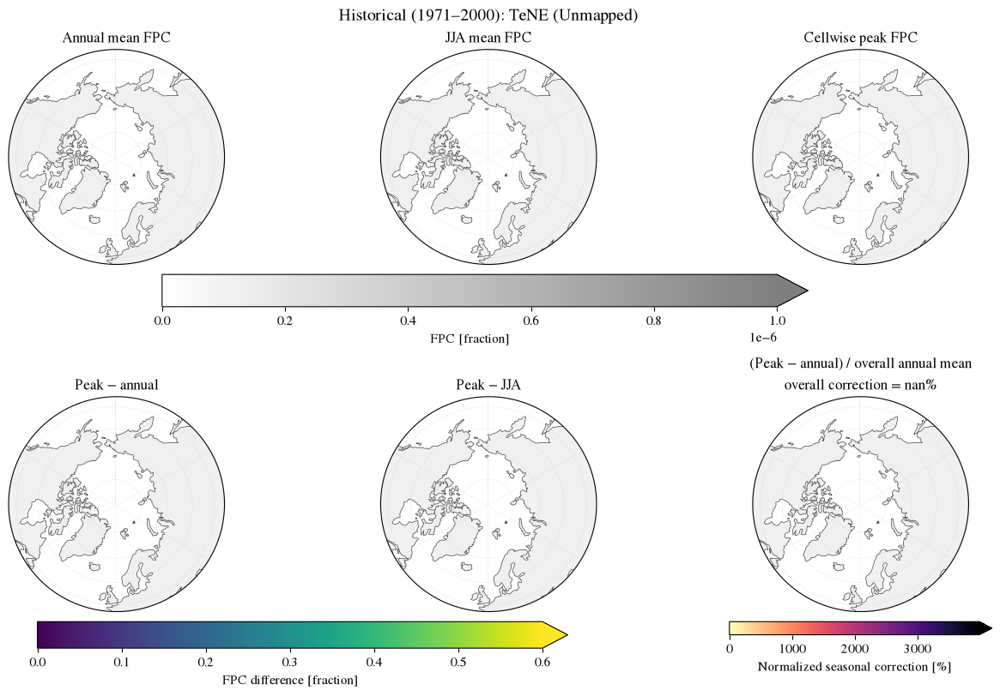

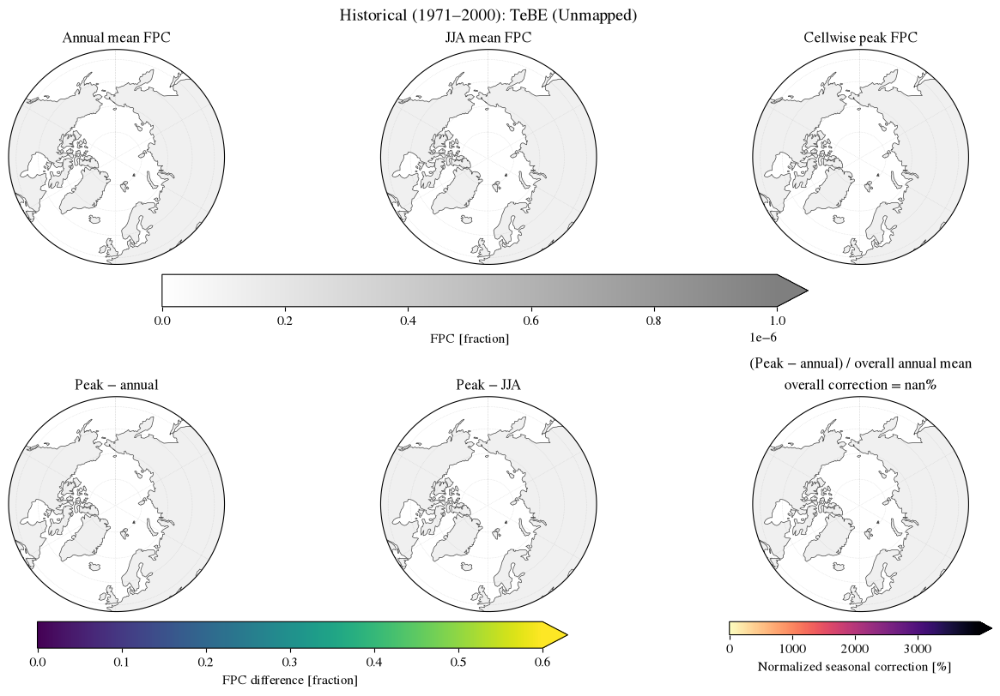

...

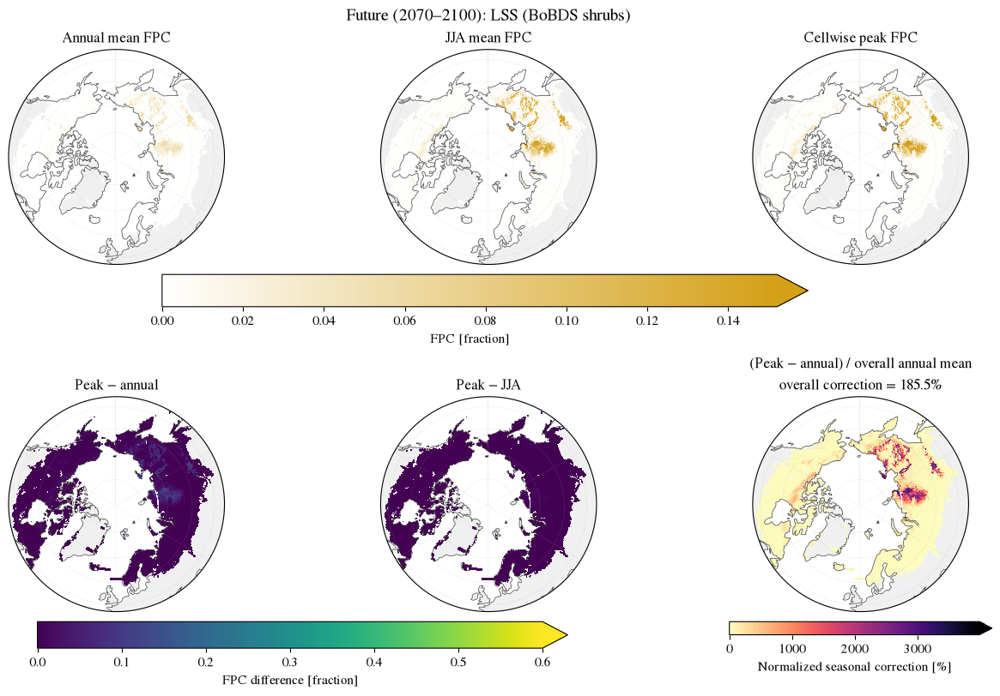

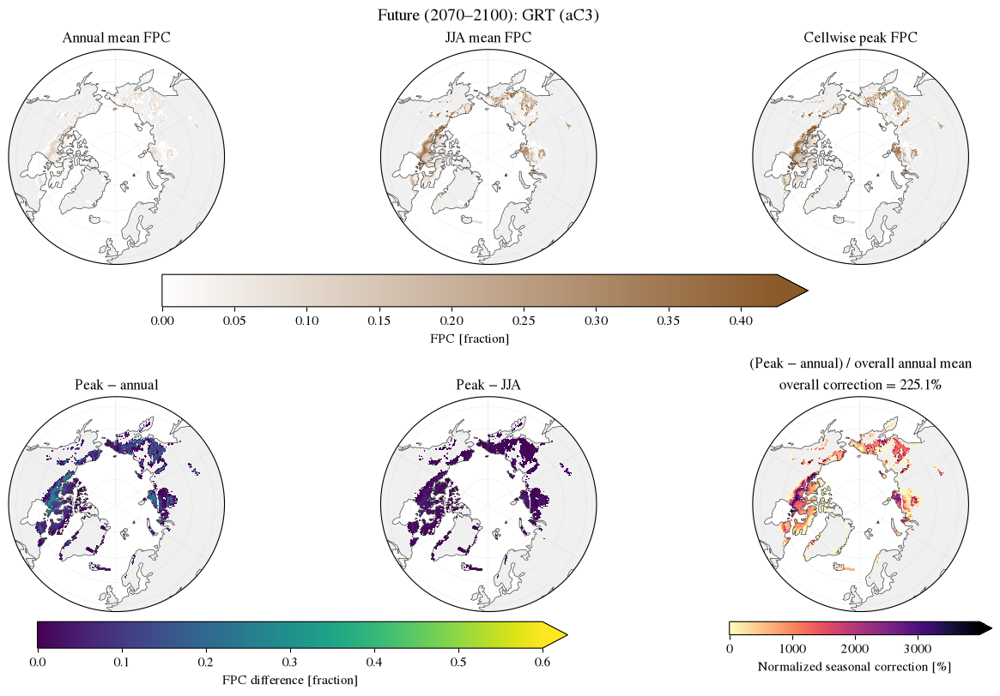

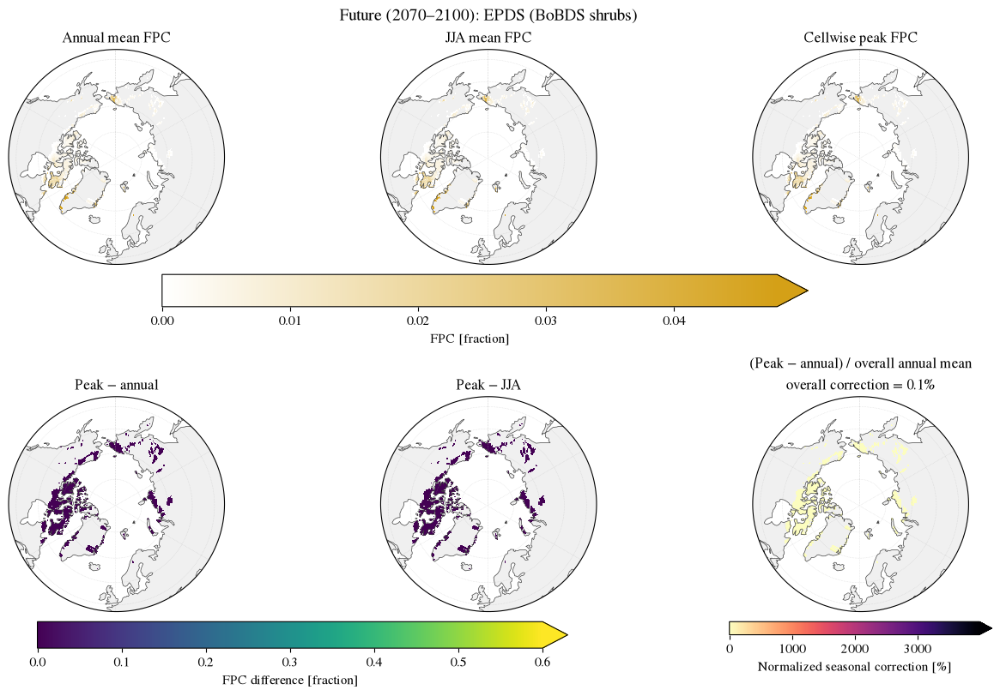

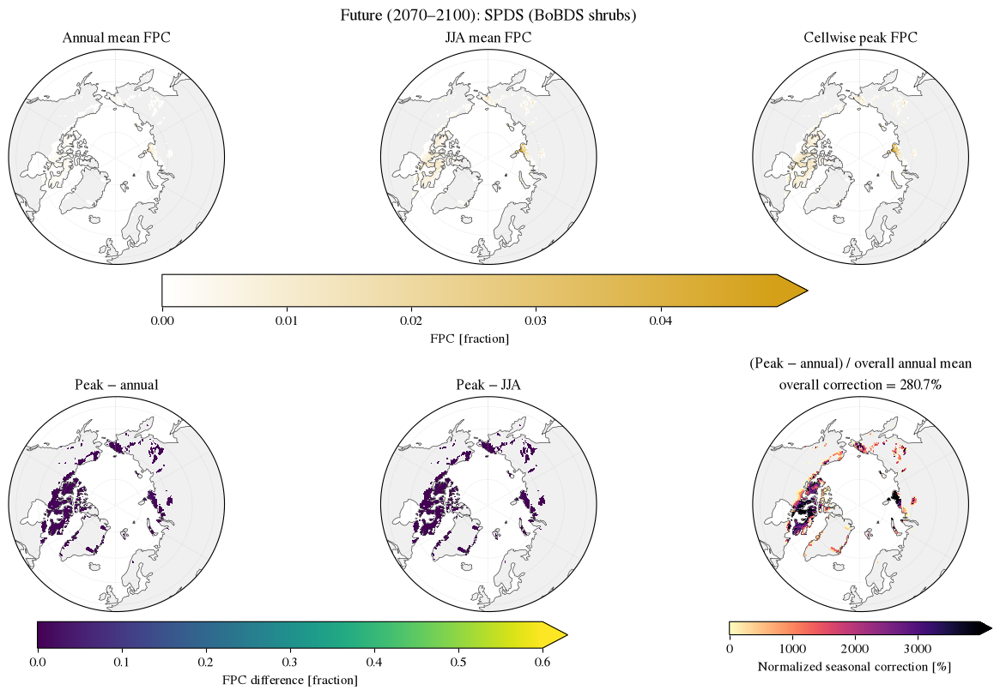

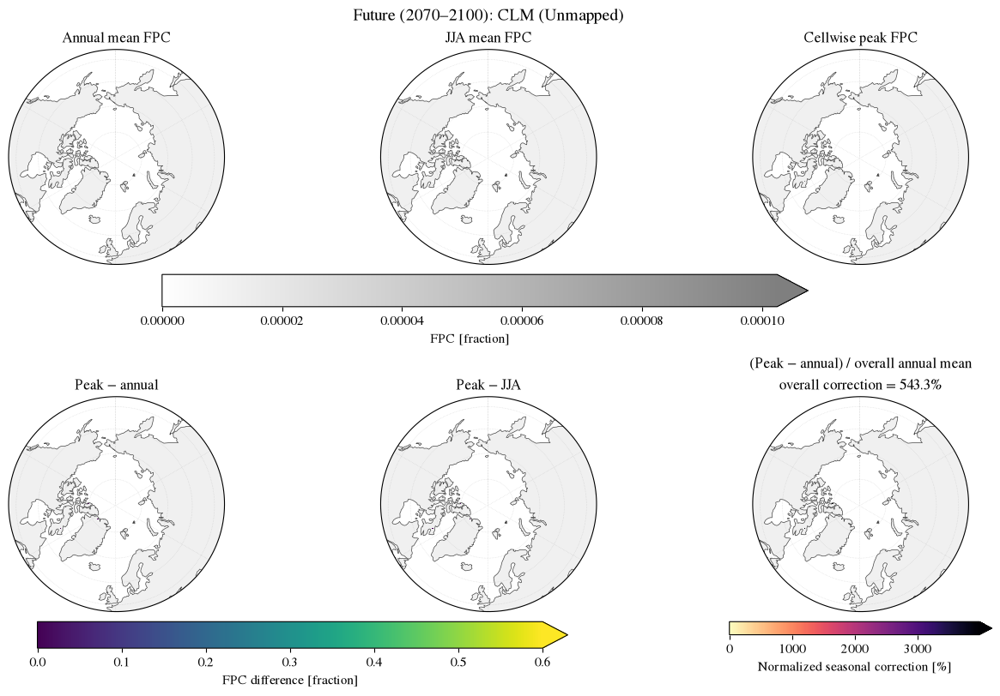

In [15]:
def robust_upper(fields, percentile=SCALE_PERCENTILE):
    arrays = [field.values[np.isfinite(field.values)] for field in fields
              if np.isfinite(field.values).any()]
    if not arrays:
        return 1e-6
    return max(float(np.percentile(np.concatenate(arrays), percentile)), 1e-6)


def configure_arctic_axis(ax):
    ax.set_extent(MAP_EXTENT, crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor="0.94", zorder=0)
    ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=0)
    ax.coastlines(linewidth=0.5, color="0.25")
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.4, color="0.65",
                 alpha=0.5, linestyle=":")
    theta = np.linspace(0, 2 * np.pi, 200)
    circle = np.column_stack([np.sin(theta), np.cos(theta)]) * 0.5 + 0.5
    ax.set_boundary(mpath.Path(circle), transform=ax.transAxes)


map_cache = {}
all_normalized_values = []
for period in data:
    derived = data[period]["derived"]
    map_cache[period] = {}
    for pft in PFTS_TO_MAP:
        annual_raw = derived.annual_mean_fpc.sel(pft=pft)
        jja_raw = derived.jja_mean_fpc.sel(pft=pft)
        peak_raw = derived.peak_fpc.sel(pft=pft)
        active = np.isfinite(annual_raw) & np.isfinite(peak_raw) & (peak_raw > PRESENCE_THRESHOLD)
        overall_annual = float(weighted_mean(annual_raw))
        normalized = (
            (100 * (peak_raw - annual_raw) / overall_annual).where(active)
            if overall_annual > 0 else xr.full_like(annual_raw, np.nan)
        )
        overall_peak = float(weighted_mean(peak_raw))
        map_cache[period][pft] = {
            "annual": annual_raw.where(active), "jja": jja_raw.where(active),
            "peak": peak_raw.where(active),
            "peak_minus_annual": (peak_raw - annual_raw).where(active),
            "peak_minus_jja": (peak_raw - jja_raw).where(active),
            "normalized": normalized,
            "overall correction": (100 * (overall_peak - overall_annual) / overall_annual
                                   if overall_annual > 0 else np.nan),
        }
        values = normalized.values
        all_normalized_values.append(values[np.isfinite(values)])

nonempty_normalized = [values for values in all_normalized_values if values.size]
NORMALIZED_VMAX = max(
    float(np.percentile(np.concatenate(nonempty_normalized), SCALE_PERCENTILE)), 1e-6
) if nonempty_normalized else 1e-6
print(f"Common normalized-correction scale: 0–{NORMALIZED_VMAX:.1f}% ({SCALE_PERCENTILE}th percentile)")


def plot_pft_maps(period, pft):
    fields = map_cache[period][pft]
    group = PFT_TO_CLM_GROUP[pft]
    color = GROUP_COLORS[group]
    pft_cmap = LinearSegmentedColormap.from_list(f"{pft}_fpc", ["#FFFFFF", color])
    absolute_vmax = robust_upper([fields["annual"], fields["jja"], fields["peak"]])
    absolute_norm = Normalize(0, absolute_vmax)
    difference_norm = Normalize(0, DIFFERENCE_VMAX)
    normalized_norm = Normalize(0, NORMALIZED_VMAX)
    projection = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    fig, axes = plt.subplots(2, 3, figsize=(13, 8), subplot_kw={"projection": projection},
                             layout="constrained")
    axes = axes.ravel()
    plot_specs = [
        (fields["annual"], "Annual mean FPC", pft_cmap, absolute_norm),
        (fields["jja"], "JJA mean FPC", pft_cmap, absolute_norm),
        (fields["peak"], "Cellwise peak FPC", pft_cmap, absolute_norm),
        (fields["peak_minus_annual"], "Peak − annual", "viridis", difference_norm),
        (fields["peak_minus_jja"], "Peak − JJA", "viridis", difference_norm),
        (fields["normalized"], "(Peak − annual) / overall annual mean\n"
                              f"overall correction = {fields['overall correction']:.1f}%",
         "magma_r", normalized_norm),
    ]
    images = []
    for ax, (field, title, cmap, norm) in zip(axes, plot_specs):
        configure_arctic_axis(ax)
        image = ax.pcolormesh(field.lon, field.lat, field, transform=ccrs.PlateCarree(),
                              shading="auto", cmap=cmap, norm=norm, rasterized=True)
        ax.set_title(title)
        images.append(image)

    absolute_bar = fig.colorbar(images[0], ax=axes[:3], orientation="horizontal",
                                shrink=0.72, pad=0.04, extend="max")
    absolute_bar.set_label("FPC [fraction]")
    difference_bar = fig.colorbar(images[3], ax=axes[3:5], orientation="horizontal",
                                  shrink=0.72, pad=0.04, extend="max")
    difference_bar.set_label("FPC difference [fraction]")
    normalized_bar = fig.colorbar(images[5], ax=axes[5], orientation="horizontal",
                                  shrink=0.72, pad=0.04, extend="max")
    normalized_bar.set_label("Normalized seasonal correction [%]")
    fig.suptitle(f"{period}: {pft} ({group})", fontsize=14)
    save_figure(fig, f"{slug(period)}_{pft.lower()}_fpc_maps")
    plt.show()


for period in data:
    for pft in PFTS_TO_MAP:
        plot_pft_maps(period, pft)


## 7 · Future minus historical maps

The anomaly is computed separately for each statistic. In particular,
`ΔFPC_peak = FPC_peak,future − FPC_peak,historical`; it is not the maximum of
the monthly future-minus-historical difference.


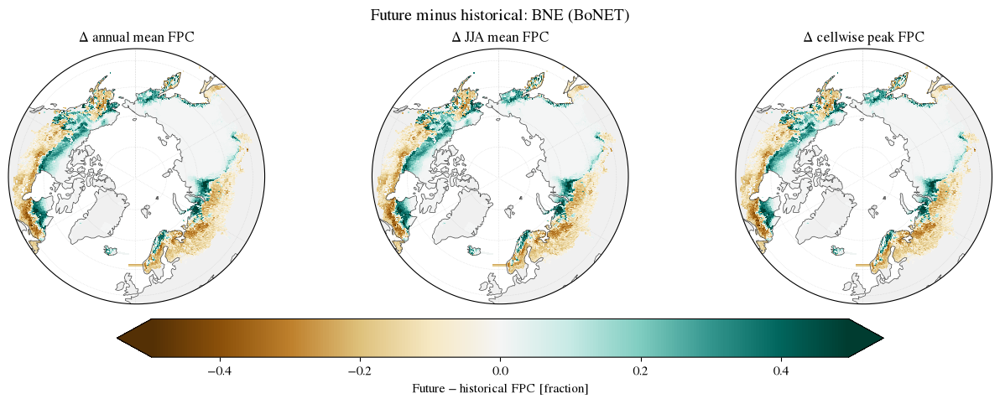

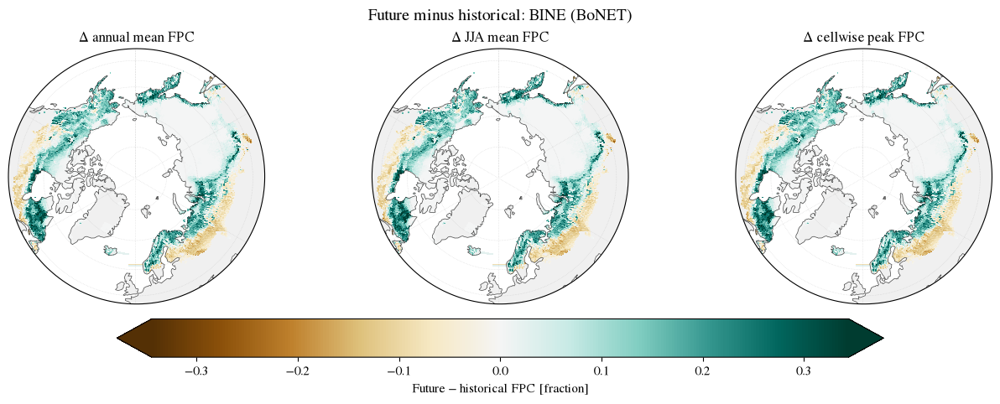

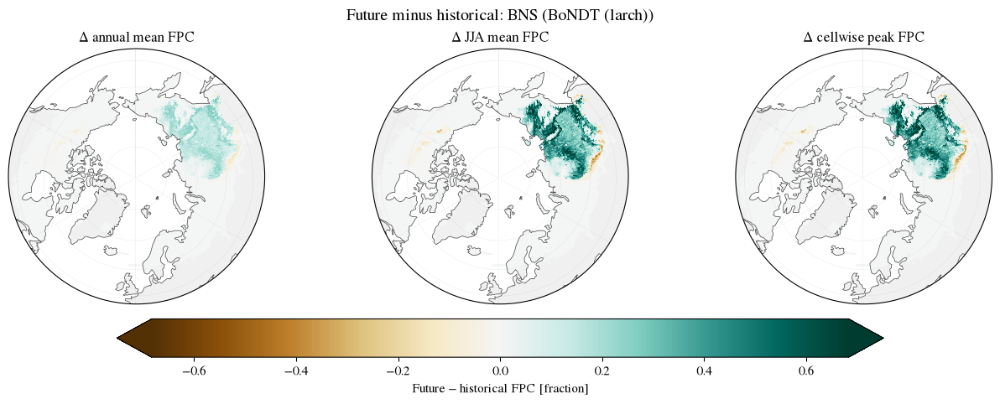

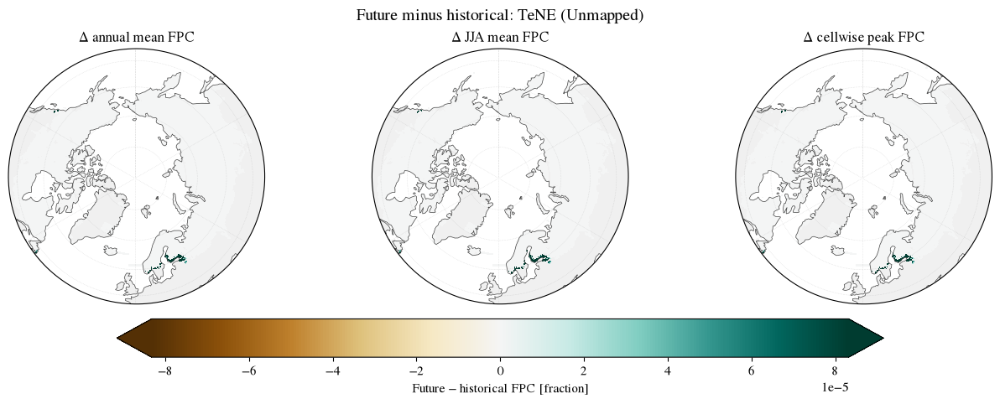

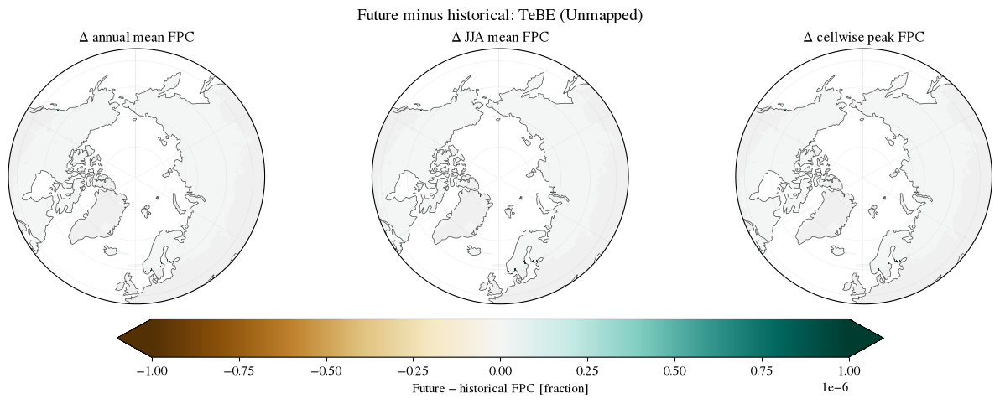

...

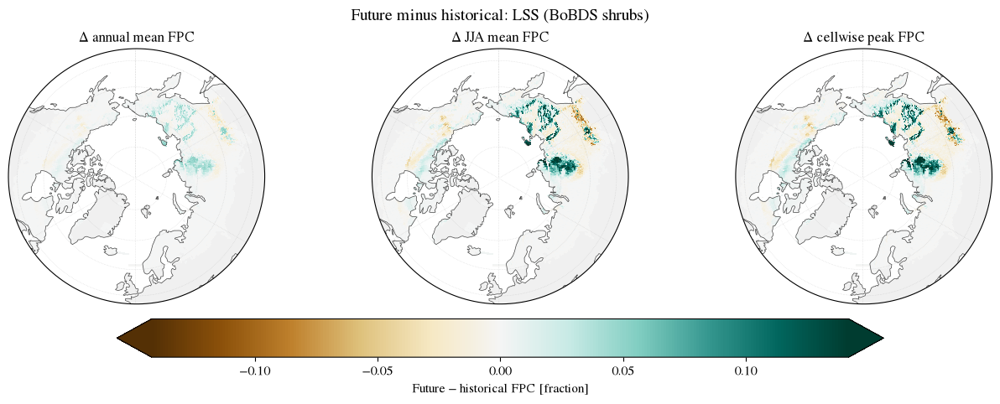

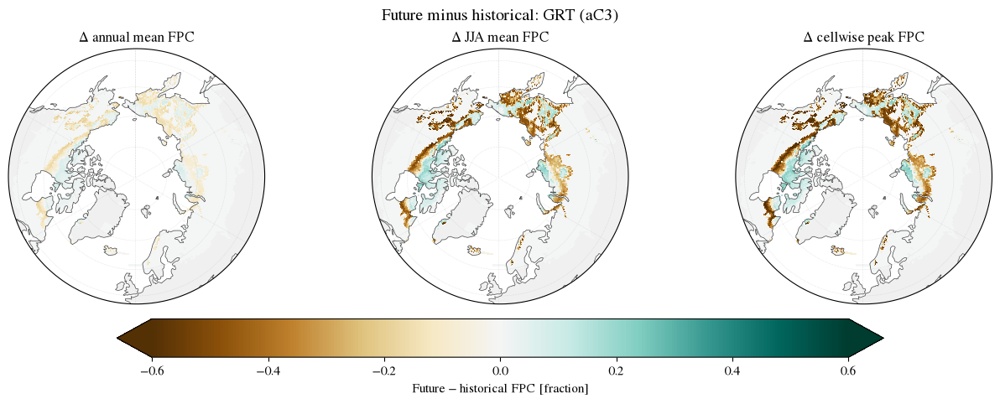

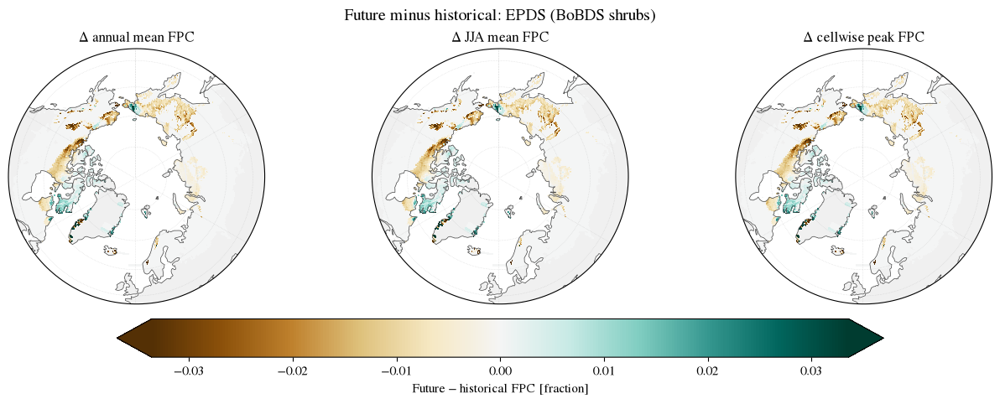

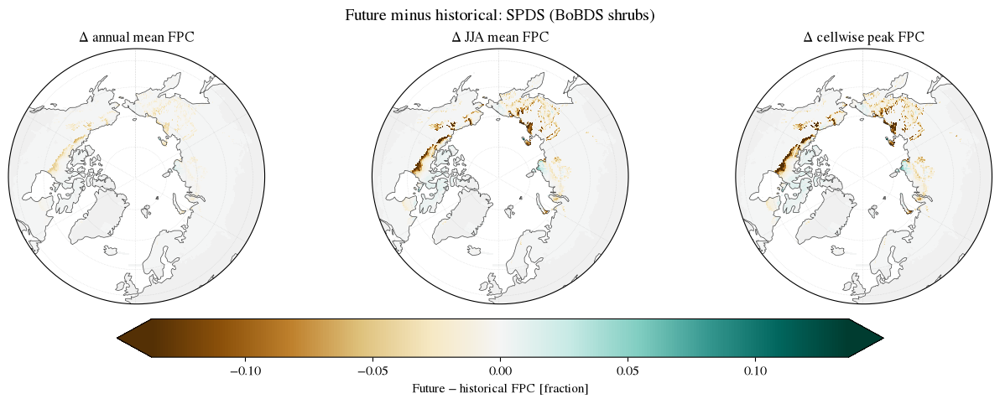

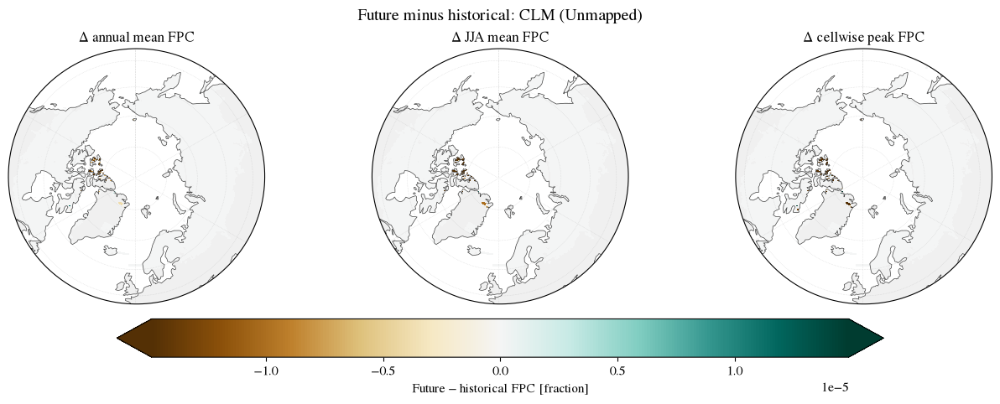

In [16]:
def plot_period_change_maps(pft):
    historical = data[historical_name]["derived"].sel(pft=pft)
    future = data[future_name]["derived"].sel(pft=pft)
    changes = [
        future.annual_mean_fpc - historical.annual_mean_fpc,
        future.jja_mean_fpc - historical.jja_mean_fpc,
        future.peak_fpc - historical.peak_fpc,
    ]
    titles = ["Δ annual mean FPC", "Δ JJA mean FPC", "Δ cellwise peak FPC"]
    arrays = [field.values[np.isfinite(field.values)] for field in changes
              if np.isfinite(field.values).any()]
    values = np.concatenate(arrays) if arrays else np.array([0.0])
    vmax = max(float(np.percentile(np.abs(values), SCALE_PERCENTILE)), 1e-6)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
    projection = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    fig, axes = plt.subplots(1, 3, figsize=(13, 4.7), subplot_kw={"projection": projection},
                             layout="constrained")
    image = None
    for ax, field, title in zip(axes, changes, titles):
        configure_arctic_axis(ax)
        image = ax.pcolormesh(field.lon, field.lat, field, transform=ccrs.PlateCarree(),
                              shading="auto", cmap="BrBG", norm=norm, rasterized=True)
        ax.set_title(title)
    colorbar = fig.colorbar(image, ax=axes, orientation="horizontal", shrink=0.72,
                            pad=0.05, extend="both")
    colorbar.set_label("Future − historical FPC [fraction]")
    fig.suptitle(f"Future minus historical: {pft} ({PFT_TO_CLM_GROUP[pft]})", fontsize=14)
    save_figure(fig, f"future_minus_historical_{pft.lower()}_fpc_maps")
    plt.show()


for pft in PFTS_TO_MAP:
    plot_period_change_maps(pft)


## 8 · FPC–LAI relationship at the FPC peak

These are descriptive paired diagnostics, not a conversion model. FPC and LAI
are sampled from the same PFT, cell and peak-FPC month.


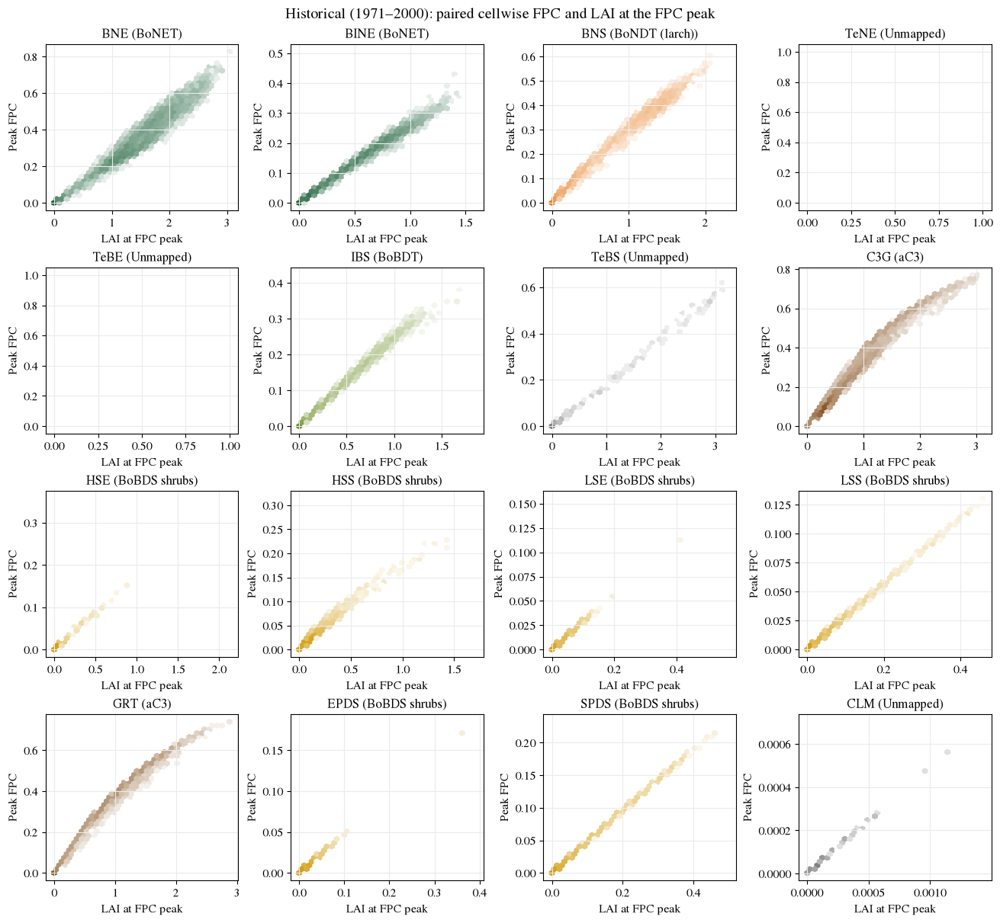

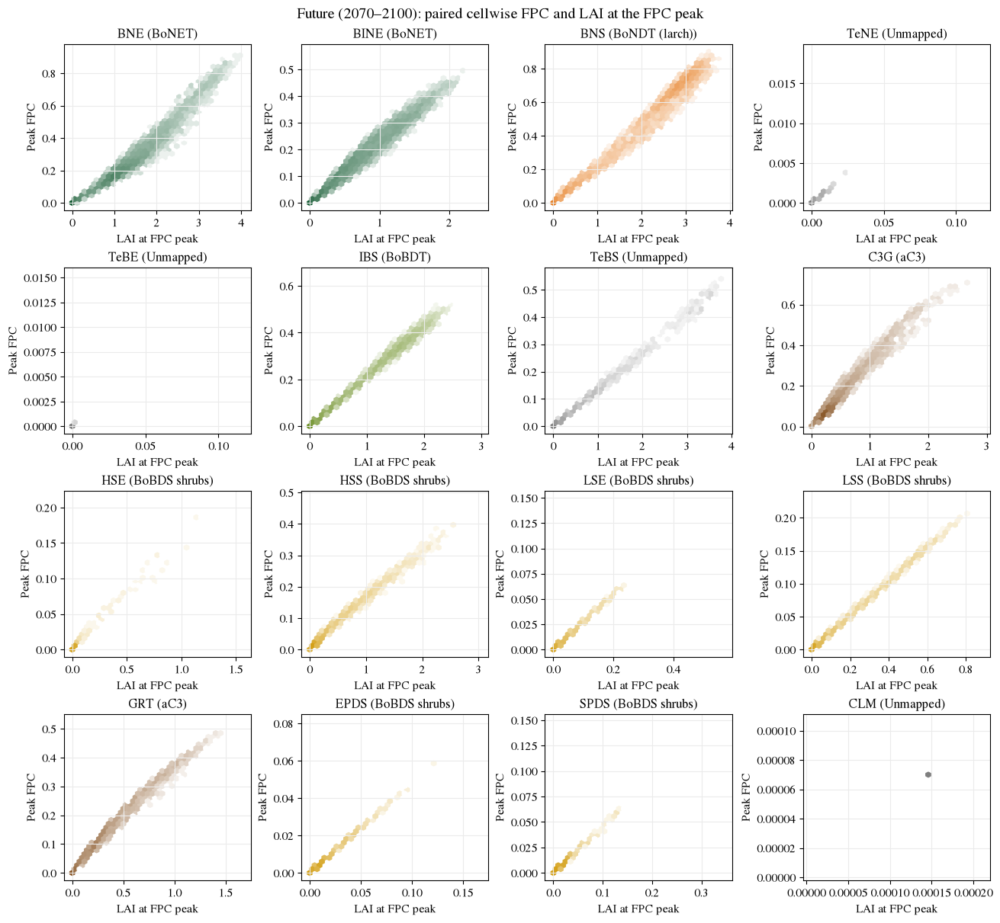

In [17]:
def plot_fpc_lai_peak(period):
    derived = data[period]["derived"]
    fig, axes = plt.subplots(4, 4, figsize=(13, 12), layout="constrained")
    for ax, pft in zip(axes.ravel(), LPJ_NATURAL):
        fpc = derived.peak_fpc.sel(pft=pft).values.ravel()
        lai = derived.lai_at_fpc_peak.sel(pft=pft).values.ravel()
        valid = np.isfinite(fpc) & np.isfinite(lai) & (fpc > PRESENCE_THRESHOLD)
        if valid.sum() > 20000:
            rng = np.random.default_rng(42)
            sample = rng.choice(np.flatnonzero(valid), 20000, replace=False)
        else:
            sample = np.flatnonzero(valid)
        ax.hexbin(lai[sample], fpc[sample], gridsize=35, mincnt=1, bins="log",
                  cmap=LinearSegmentedColormap.from_list("density", ["white", GROUP_COLORS[PFT_TO_CLM_GROUP[pft]]]))
        ax.set(title=f"{pft} ({PFT_TO_CLM_GROUP[pft]})", xlabel="LAI at FPC peak",
               ylabel="Peak FPC")
        ax.grid(color="0.92")
    fig.suptitle(f"{period}: paired cellwise FPC and LAI at the FPC peak", fontsize=14)
    save_figure(fig, f"{slug(period)}_fpc_lai_at_peak")
    plt.show()


for period in data:
    plot_fpc_lai_peak(period)


## 9 · Output inventory


In [18]:
created = sorted(path for path in FIGURE_DIR.iterdir() if path.suffix in {".png", ".pdf"})
print(f"Created {len(created)} figure files in {FIGURE_DIR.resolve()}")
for path in created:
    print(path.name)


Created 112 figure files in /cluster/home/adelez/BOREAL-FOREST-EXPANSION/preprocess/edit-surfdatafile/monthly-lpjguess-exploration-figures
future__2070_2100_annual_jja_peak_fpc.pdf
future__2070_2100_annual_jja_peak_fpc.png
future__2070_2100_bine_fpc_maps.pdf
future__2070_2100_bine_fpc_maps.png
future__2070_2100_bne_fpc_maps.pdf
future__2070_2100_bne_fpc_maps.png
future__2070_2100_bns_fpc_maps.pdf
future__2070_2100_bns_fpc_maps.png
future__2070_2100_c3g_fpc_maps.pdf
future__2070_2100_c3g_fpc_maps.png
future__2070_2100_clm_fpc_maps.pdf
future__2070_2100_clm_fpc_maps.png
future__2070_2100_epds_fpc_maps.pdf
future__2070_2100_epds_fpc_maps.png
future__2070_2100_fpc_lai_at_peak.pdf
future__2070_2100_fpc_lai_at_peak.png
future__2070_2100_fpc_seasonal_cycles.pdf
future__2070_2100_fpc_seasonal_cycles.png
future__2070_2100_grt_fpc_maps.pdf
future__2070_2100_grt_fpc_maps.png
future__2070_2100_hse_fpc_maps.pdf
future__2070_2100_hse_fpc_maps.png
future__2070_2100_hss_fpc_maps.pdf
future__2070_2100_